In [1]:
import copy
import math
import scipy
import pickle
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm import tqdm
from scipy.spatial import Delaunay

In [2]:
RU_VECTORIZED_CORPUS = "test.npy"

In [3]:
def delete_nans(corpus: list) -> list:
    result_corpus = []
    for text in tqdm(corpus):
        dict_ = {key: value for key, value in text.items() if value is not None}
        result_corpus.append(dict_)
    return result_corpus

In [4]:
ru_corpus = delete_nans(np.load(RU_VECTORIZED_CORPUS, allow_pickle=True).tolist())

100%|██████████| 4/4 [00:00<00:00, 13808.41it/s]


In [5]:
test = ru_corpus[:4]

# Node and Graph

In [6]:
def create_vertices(text: list) -> dict:
    vertices = dict()
    for text in tqdm(text):
        for word, vector in text.items():
            if word not in vertices.keys():
                vertices[word] = Node(vector[:2], set())
    return vertices

In [7]:
class Node:
    def __init__(self, vector: np.ndarray, neighbours: set):
        self.__vector = copy.deepcopy(vector)
        self.__neighbours = copy.deepcopy(neighbours)
        
    @property
    def vector(self):
        return self.__vector
    
    @vector.setter
    def vector(self, vector: np.ndarray):
        self.__vector = copy.deepcopy(vector)
        
    @property
    def neighbours(self):
        return self.__neighbours
    
    @neighbours.setter
    def neighbours(self, neighbours: set):
        self.__neighbours = copy.deepcopy(neighbours)

In [8]:
class Graph:
    def __init__(self, vertices: dict):
        self.__vertices = copy.deepcopy(vertices)
    
    @property
    def vertices(self):
        return self.__vertices
    
    @vertices.setter
    def vertices(self, vertices: dict):
        self.__vertices = copy.deepcopy(vertices)
    
    def get_vectors(self) -> list:
        vectors = list()
        for node in self.vertices.values():
            vectors.append(node.vector.tolist())
        return vectors
    
    def get_words(self) -> list:
        words = list()
        for word in self.vertices.keys():
            words.append(word)
        return words

    def get_edges(self) -> set:
        edges = set()
        for word, node in self.vertices.items():
            for neighbour in node.neighbours:
                if (word, neighbour) in edges or (neighbour, word) in edges:
                    continue
                edges.add((word, neighbour))
        return edges
    
    def get_other_words(self, word: str) -> set:
        return set(self.vertices.keys()).difference(set([word]))
    
    def delete_edge(self, first_word: str, second_word: str):
        self.vertices[first_word].neighbours.difference_update(set([second_word]))
        self.vertices[second_word].neighbours.difference_update(set([first_word]))
        
    def add_edge(self, first_word: str, second_word: str):
        self.vertices[first_word].neighbours.update(set([second_word]))
        self.vertices[second_word].neighbours.update(set([first_word]))

    def reset_graph_neighbours(self):
        for node in self.vertices.values():
            node.neighbours.clear()
    
    def euclid_distance(self, first_word: str, second_word: str) -> np.float64:
        first_vertex = self.vertices[first_word].vector
        second_vertex = self.vertices[second_word].vector
        return np.linalg.norm(first_vertex - second_vertex)
    
    def get_knn(self, word: str, k: int) -> list:
        distance_dict = dict()
        other_words = self.get_other_words(word)
        for other_word in other_words:
            distance_dict[other_word] = self.euclid_distance(word, other_word)
        lambda_ = lambda item: item[1]
        words = [key for key, value in sorted(distance_dict.items(), key=lambda_)]
        return words[:k]
    
    def get_sphere_radius(self, word: str) -> float:
        return self.euclid_distance(word, self.get_knn(word, 1)[0])
        
    def in_sphere_check(self, first_word: str, second_word: str) -> bool:
        nearest_neighbour = self.get_knn(first_word, 1)
        radius = self.euclid_distance(first_word, nearest_neighbour)
        distance = self.euclid_distance(first_word, second_word)
        if radius < distance:
            return False
        return True
    
    def plot_graph(self,
               figsize=(60, 60),
               dpi=120,
               lines_color='royalblue',
               points_type='ro',
               points_color='forestgreen',
               xytext=(10,10),
               textcoords='offset points'):
        plt.figure(figsize=figsize, dpi=dpi)
        for edge in self.get_edges():
            first_word, second_word = edge
            first_vector = self.vertices[first_word].vector
            second_vector = self.vertices[second_word].vector
            edge_vectors = np.concatenate([[first_vector], [second_vector]])
            plt.plot(edge_vectors[:, 0], edge_vectors[:, 1], color=lines_color)
            plt.annotate(first_word, (edge_vectors[0, 0], edge_vectors[0, 1]), xytext=xytext, textcoords=textcoords)
            plt.annotate(second_word, (edge_vectors[1, 0], edge_vectors[1, 1]), xytext=xytext, textcoords=textcoords)
            plt.plot(edge_vectors[:, 0], edge_vectors[:, 1], points_type, color=points_color)
        plt.show()

## Граф $\varepsilon$-окружности ($\varepsilon$-ball)

In [9]:
class EBall(Graph):
    def __init__(self, vertices: dict):
        super().__init__(vertices)
    
    def create_eball_graph(self, epsilon: int):
        self.reset_graph_neighbours()
        for first_word in tqdm(self.vertices.keys()):
            other_words = self.get_other_words(first_word)
            for second_word in other_words:
                distance = self.euclid_distance(first_word, second_word)
                if distance < epsilon:
                    self.add_edge(first_word, second_word)

## Граф Габриэля (GG)

In [10]:
class GG(Graph):
    def __init__(self,
                 vertices: dict,
                 triangles: list = list(),
                 delaunay: scipy.spatial.qhull.Delaunay = None):
        super().__init__(vertices)
        self.__triangles = copy.deepcopy(triangles)
        self.__delaunay = copy.deepcopy(delaunay)
        
    @property
    def triangles(self):
        return self.__triangles
    
    @triangles.setter
    def triangles(self, triangles: list):
        self.__triangles = copy.deepcopy(triangles)
        
    @property
    def delaunay(self):
        return self.__delaunay
    
    @delaunay.setter
    def delaunay(self, delaunay: scipy.spatial.qhull.Delaunay):
        self.__delaunay = copy.deepcopy(delaunay)

    def create_delaunay_graph(self):
        self.reset_graph_neighbours()
        vectors = self.get_vectors()
        words = self.get_words()
        word_num_dict = {word: num for word, num in enumerate(words)}
        self.delaunay = Delaunay(np.array(vectors))
        delaunay_graph = self.delaunay.simplices.tolist()
        for triangle in delaunay_graph:
            triangle_words = set(map(word_num_dict.get, triangle))
            self.triangles.append(triangle_words)
            for word in triangle_words:
                new_neighbours = triangle_words.difference(set([word]))
                self.vertices[word].neighbours.update(new_neighbours)
    
    def in_edge_sphere(self, edge: tuple, neighbour: str) -> bool:
        edge_length = self.euclid_distance(edge[0], edge[1])
        first_to_neighbour = self.euclid_distance(edge[0], neighbour)
        second_to_neighbour = self.euclid_distance(edge[1], neighbour)
        if edge_length < math.sqrt(first_to_neighbour ** 2 + second_to_neighbour ** 2):
            return False
        return True
    
    def create_gabriel_graph(self):
        self.create_delaunay_graph()
        for triangle in self.triangles:
            edges = list(itertools.combinations(triangle, 2))
            for edge in edges:
                neighbours = triangle.difference(set(edge))
                for neighbour in neighbours:
                    if self.in_edge_sphere(edge, neighbour):
                        self.delete_edge(edge[0], edge[1])

## Граф влияния (IG)

In [11]:
class IG(Graph):
    def __init__(self, vertices: dict):
        super().__init__(vertices)
    
    
    def create_influence_graph(self):
        self.reset_graph_neighbours()
        for first_word in tqdm(self.vertices.keys()):
            other_words = self.get_other_words(first_word)
            first_radius = self.get_sphere_radius(first_word)
            for second_word in other_words:
                second_radius = self.get_sphere_radius(second_word)
                distance = self.euclid_distance(first_word, second_word)
                if distance <= first_radius + second_radius:
                    self.add_edge(first_word, second_word)

## Граф $k$-ближайших соседей (NNG)

In [12]:
class NNG(Graph):
    def __init__(self, vertices: dict):
        super().__init__(vertices)
    
    def create_nn_graph(self, k: int):
        self.reset_graph_neighbours()
        for word in tqdm(self.vertices.keys()):
            knn_list = self.get_knn(word, k)
            for neighbour in knn_list:
                self.add_edge(word, neighbour)

## Граф относительного соседства (RNG)

In [13]:
class RNG(GG):
    def __init__(self,
                 vertices: dict,
                 triangles: list = list(),
                 delaunay: scipy.spatial.qhull.Delaunay = None):
        super().__init__(vertices, triangles, delaunay)
    
    def create_rn_graph(self):
        self.create_gabriel_graph()
        for word in tqdm(self.vertices.keys()):
            neighbours = copy.deepcopy(self.vertices[word].neighbours)
            for neighbour in neighbours:
                for other_word in self.get_other_words(word):
                    if neighbour == other_word:
                        continue
                    word_to_neighbour_distance = self.euclid_distance(word, neighbour)
                    word_to_other_word_distance = self.euclid_distance(word, other_word)
                    neighbour_to_other_word_distance = self.euclid_distance(neighbour, other_word)
                    if max(word_to_other_word_distance, neighbour_to_other_word_distance) <= word_to_neighbour_distance:
                        self.delete_edge(word, neighbour)

# Grapgh Visualization

In [14]:
vertices = create_vertices(test)

100%|██████████| 4/4 [00:00<00:00, 335.81it/s]


100%|██████████| 220/220 [00:00<00:00, 404.88it/s]


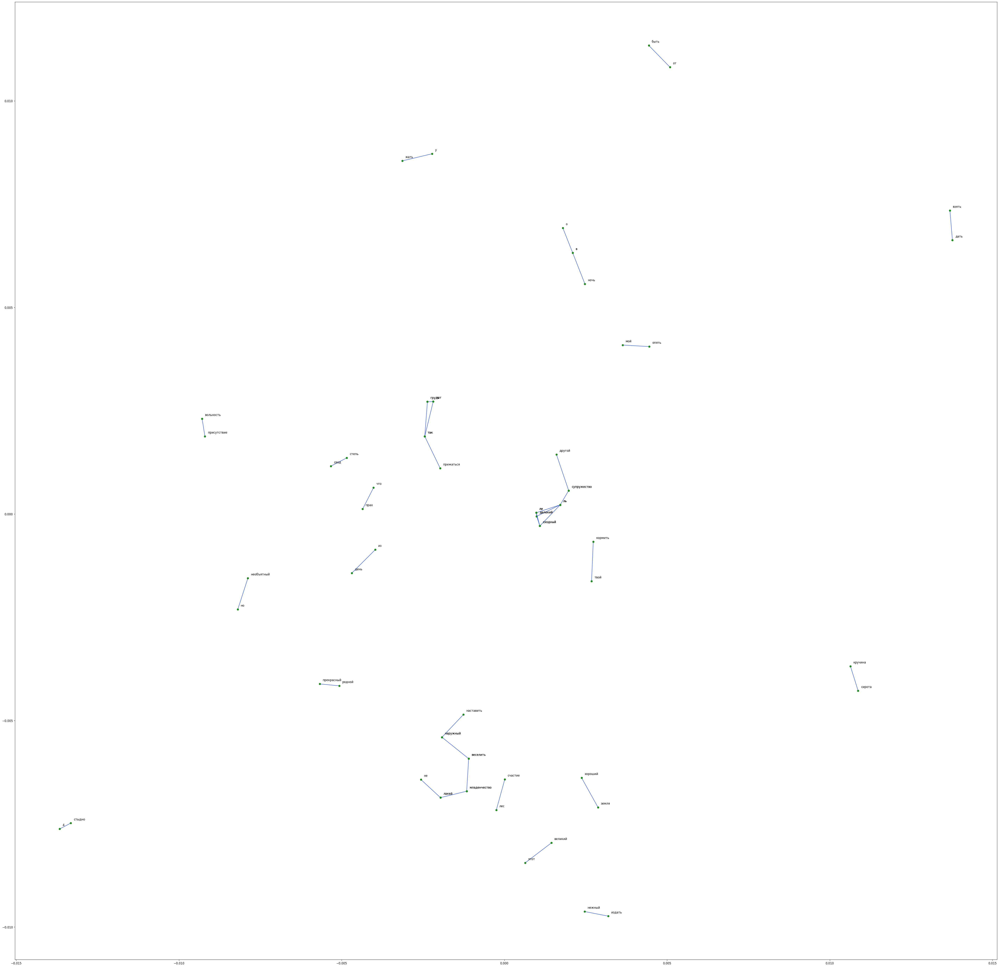

In [15]:
ru_eball = EBall(vertices)
ru_eball.create_eball_graph(0.001)
ru_eball.plot_graph()

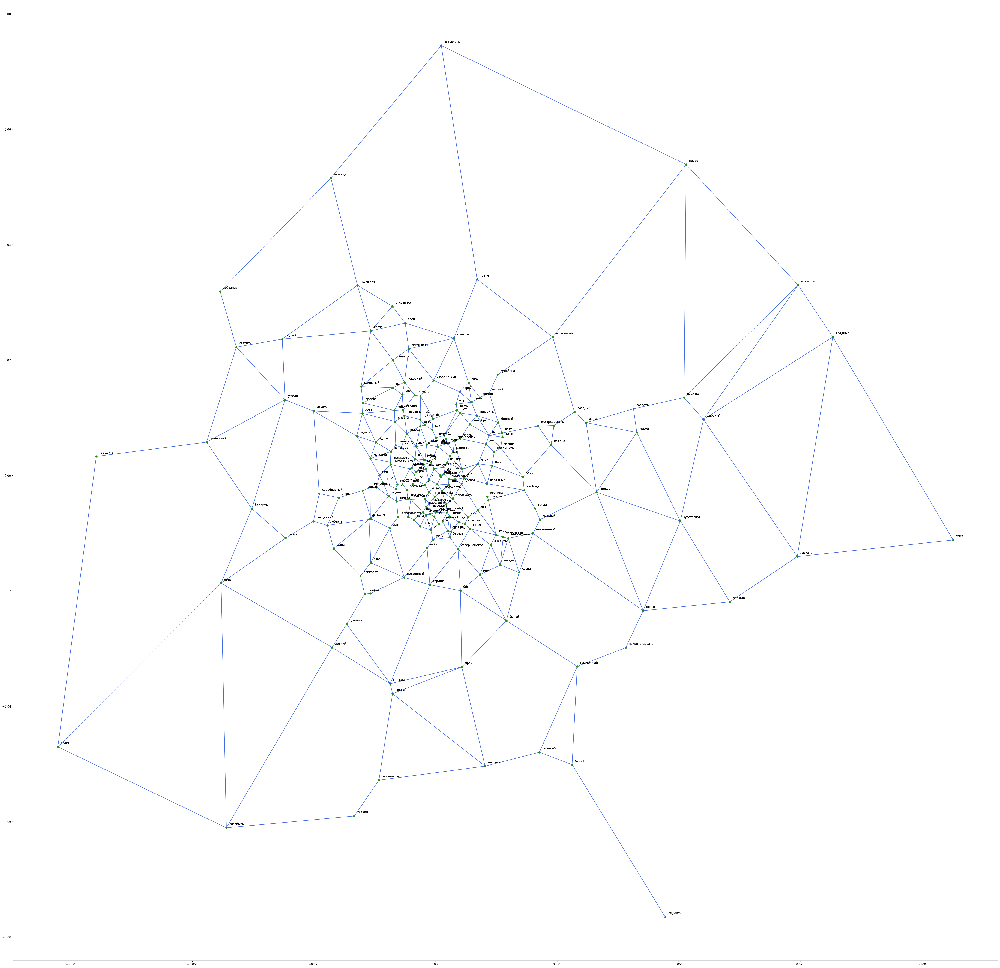

In [16]:
gg = GG(vertices)
gg.create_gabriel_graph()
gg.plot_graph()

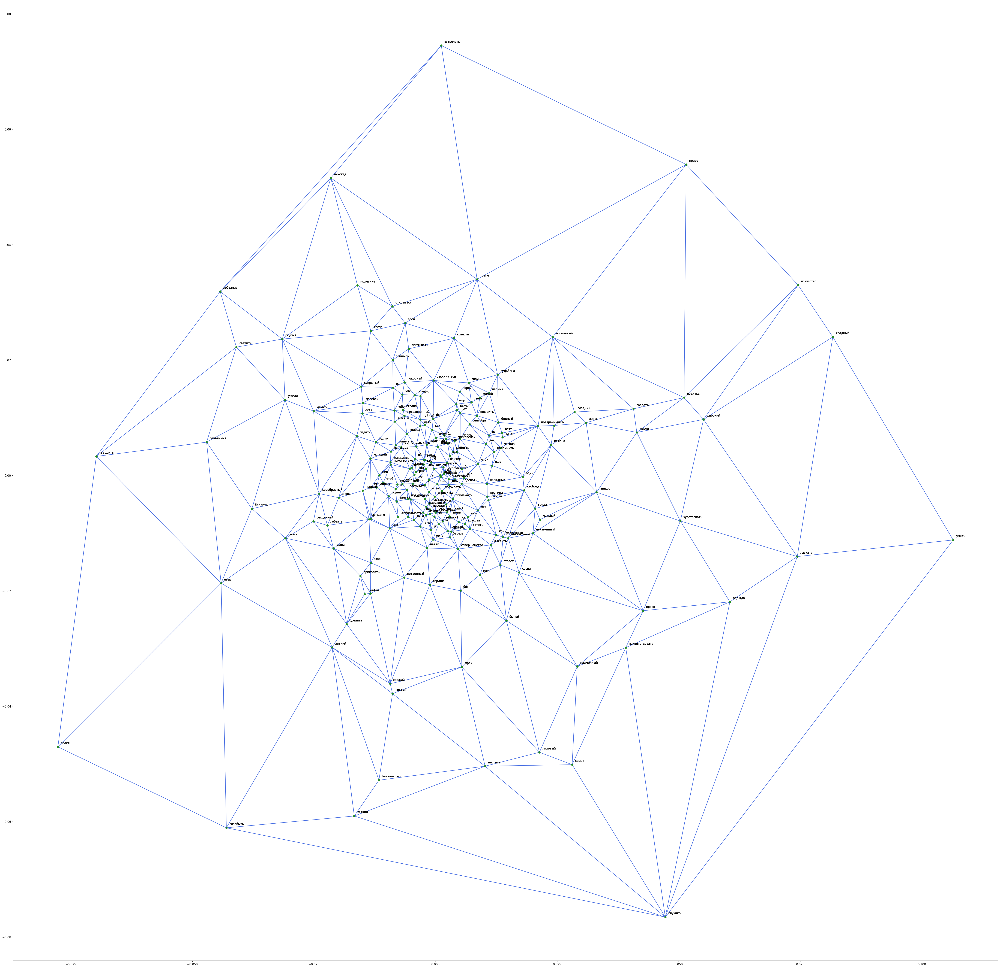

In [17]:
dt = GG(vertices)
dt.create_delaunay_graph()
dt.plot_graph()

100%|██████████| 220/220 [01:36<00:00,  2.27it/s]


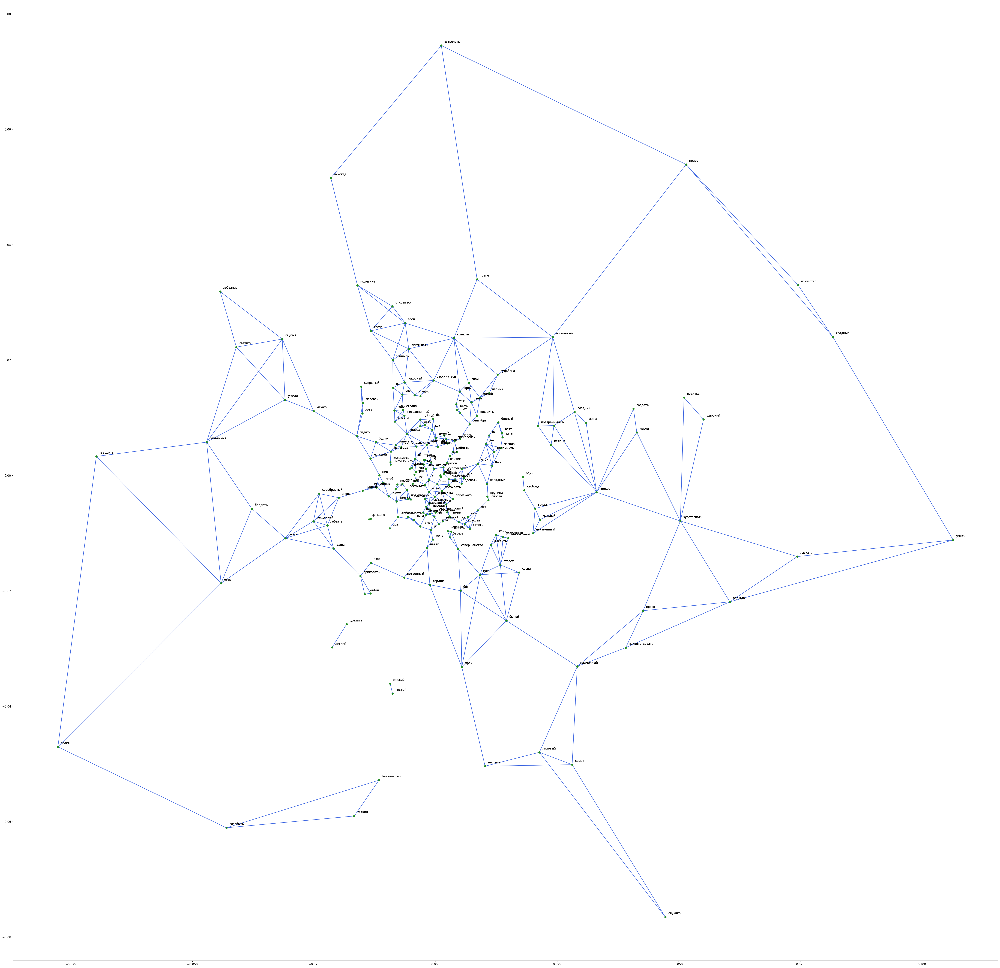

In [18]:
ig = IG(vertices)
ig.create_influence_graph()
ig.plot_graph()

100%|██████████| 220/220 [00:00<00:00, 316.08it/s]


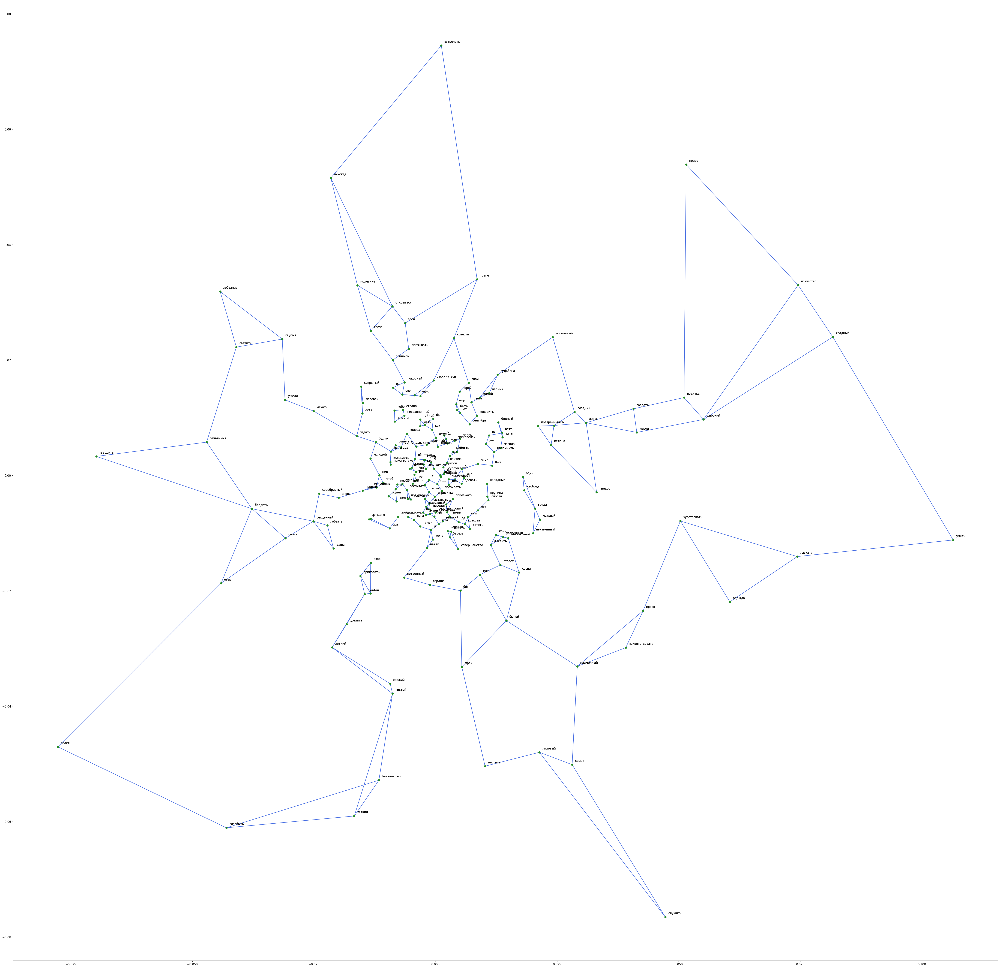

In [19]:
nng = NNG(vertices)
nng.create_nn_graph(2)
nng.plot_graph()

100%|██████████| 220/220 [00:04<00:00, 44.21it/s]


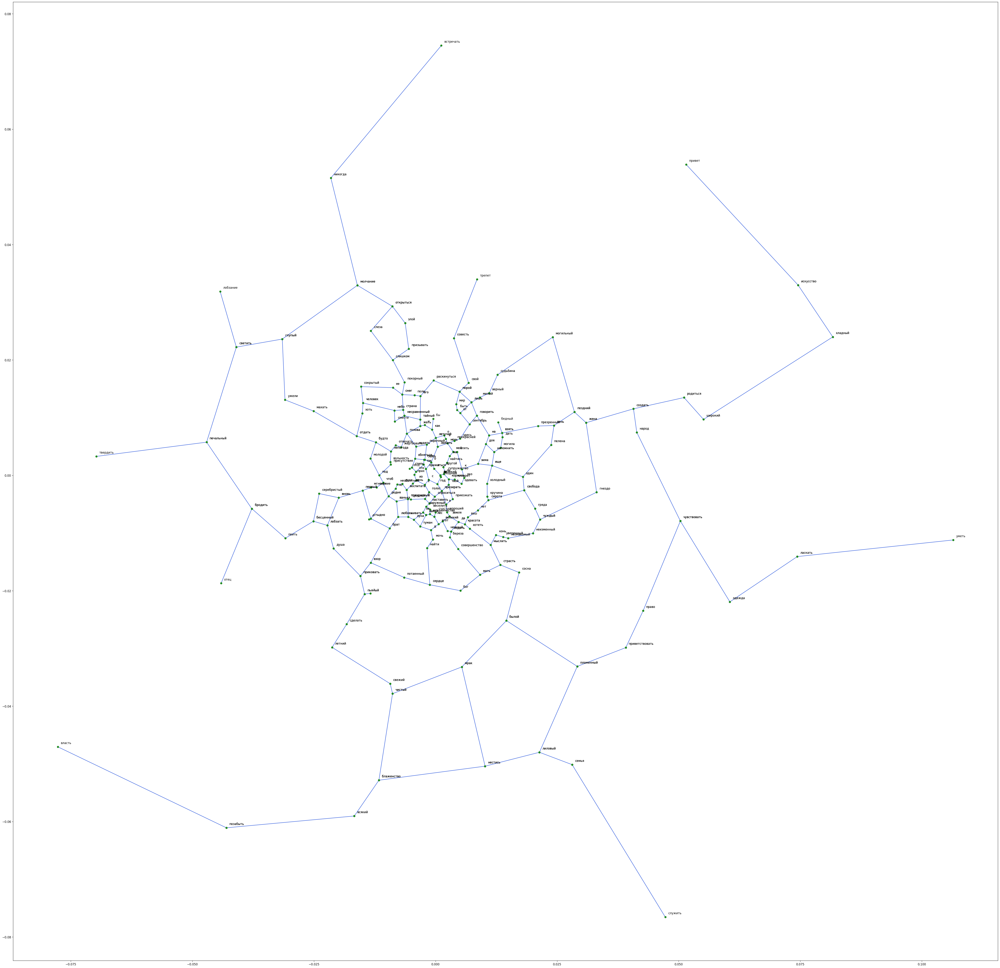

In [20]:
rng = RNG(vertices)
rng.create_rn_graph()
rng.plot_graph()

# Save Graph

In [ ]:
with open("vertices.pkl", "wb") as f:
    pickle.dump(vertices, f)

In [ ]:
# vertices = dict()
# for text in tqdm(test):
#     for word, vector in text.items():
#         neighbours = set(text.keys()).difference(set([word]))
#         if word not in vertices.keys():
#             vertices[word] = Node(vector, neighbours)
#         else:
#             vertices[word].neighbours.update(neighbours)
# ru_graph = Graph(vertices)